## Семинар №1. Digital Signal Processing

### План📝:

- ##### Audioformats

- ##### Python and Audio

- ##### Resampling

- ##### DFT

- ##### STFT

- ##### Spectrogram and mel-spectrogram

- ##### Digital Filtering

- ##### Digital synthesis

In [34]:
import os
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
import torch
import librosa.display
from ipywidgets import interact, fixed, FloatSlider
from scipy import signal

### Audio file format
Существует множество форматов представления звука, и каждый имеет свои уникальные особенности. Давайте рассмотрим несколько наиболее популярных.

**`1. WAV (Waveform Audio File Format)`** - это формат без сжатия, который разработали в 1991 году компании IBM и Microsoft.

- **Качество**: отсутствуют потери в качестве
- **Размер**: довольно большой
- **Использование**: в профессиональной записи и редактировании звука, где качество является первостепенным

**`2. MP3 (MPEG Audio Layer III)`** - это формат сжатия с потерями, который разработали в Германии в начале 90-х годов прошлого века. Принцип сжатия схож с компрессией формата `.jpeg`: звуковой файл разделяется на отдельные части, из которых удаляются фрагменты, которые человеческое ухо неспособно различить. После склеивания фреймов аудио становится гораздо легче.

- **Качество**: зависит от битрейта, но обычно оно ниже, чем у `WAV` и `FLAC`
- **Размер**: в разы меньше WAV-файлов
- **Использование**: во многих стриминговых сервисах и музыкальных онлайн-библиотеках, для аудиокниг и подкастов

**`3. FLAC (Free Lossless Audio Codec)`** - это формат сжатия без потерь, который разработали в 2000 году. В процессе сжатия звук разрезается на несколько фреймов размером в несколько килобайт и для каждого алгоритм подбирает наиболее подходящий способ сжатия. 

- **Качество**: такое же, как и в оригинальной записи
- **Размер файла**: может уменьшится в 2-3 раза
- **Использование**: для архивирования аудиоданных, где качество важно, но допустимо некоторое сжатие

В следующем примере показана разница в размере аудиофайлов `WAV` и `MP3`.


In [35]:
audio_wav = ipd.Audio(filename='audio/C4_Piano.wav')
size_wav = os.path.getsize('audio/C4_Piano.wav')
print(f'Size of wav file: {size_wav} bytes')
ipd.display(audio_wav)

audio_mp3 = ipd.Audio(filename='audio/C4_Piano.mp3')
size_mp3 = os.path.getsize('audio/C4_Piano.mp3')
print(f'Size of mp3 file: {size_mp3} bytes')
ipd.display(audio_mp3)

Size of wav file: 91052 bytes


Size of mp3 file: 17007 bytes


### Python and Audio

Существует несколько способов популярных библиотек для чтения и записи аудиофайлов на Python. Давайте разберем три наиболее популярных и обсудим их преимущества и недостатки.

#### SoundFile

Библиотека **`soundfile`** предоставляет функции для чтения и записи звуковых файлов с помощью функций `soundfile.read` и `soundfile.write`.

- Загруженное аудио преобразуется в тип `float` с амплитудами в диапазоне $[-1,1]$. Это значение по умолчанию можно изменить с помощью параметра `dtype`.
- При записи использует `16-битное PCM`, то есть сигнал принимает одно из $2^{16} = 65 536$ возможных значений,
- Не поддерживает передискретизацию (`resampling`).

In [36]:
def print_plot_play(x, sr, text=''):   
    print('%s sr = %d, x.shape = %s, x.dtype = %s' % (text, sr, x.shape, x.dtype))
    plt.figure(figsize=(10, 2.5))
    plt.plot(x.T, color='dodgerblue')
    plt.xlabel('Sample number')
    plt.ylabel('Amplitude')
    plt.tight_layout()
    plt.show()
    ipd.display(ipd.Audio(data=x, rate=sr))

WAV file (default):  sr = 11025, x.shape = (45504,), x.dtype = float64


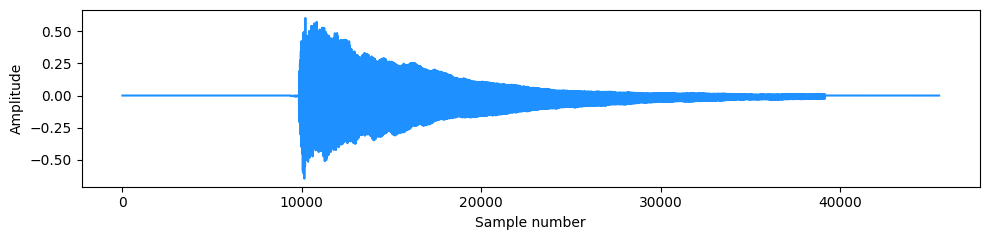

WAV file (dtype=int16):  sr = 11025, x.shape = (45504,), x.dtype = int16


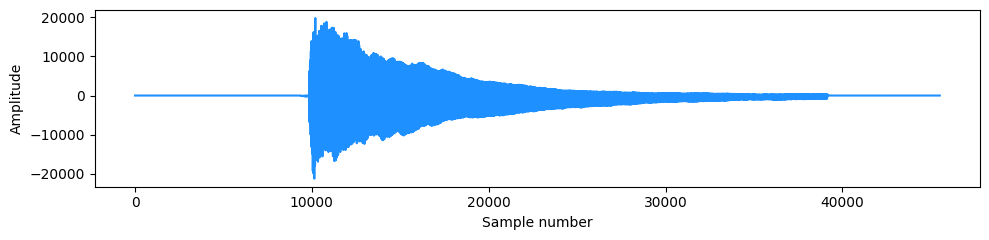

In [37]:
import soundfile as sf

# Read wav with default
x, sr = sf.read('audio/C4_Piano.wav')
print_plot_play(x=x, sr=sr,text='WAV file (default): ')

# Read wav with dtype='int16'
x, sr = sf.read('audio/C4_Piano.wav', dtype= 'int16')
print_plot_play(x=x,sr=sr,text='WAV file (dtype=int16): ')

#### LibROSA

Еще один из вариантов чтения аудио — использовать функцию `librosa.load` из библиотеки **`LibROSA`**:
- По умолчанию `librosa.load` пересэмплирует звук в 22050 Гц. Если хотите сохранить собственную частоту дискретизации используйте параметр `sr`.
- Загруженное аудио преобразуется в тип `float` с амплитудами в диапазоне $[-1,1]$.
- `librosa.load` — это, по сути, оболочка, которая использует либо `PySoundFile`, либо `audioread`.

WAV file:  sr = 11025, x.shape = (45504,), x.dtype = float32


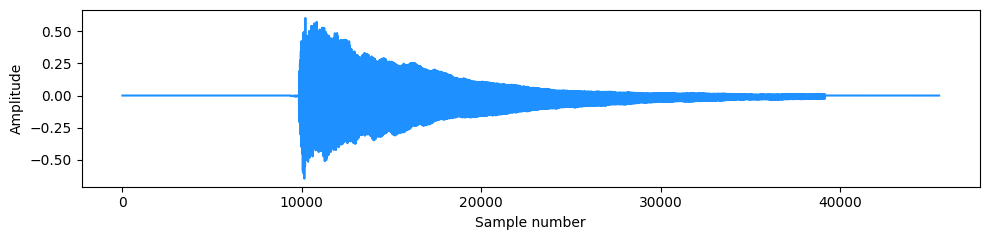

MP3 file:  sr = 11025, x.shape = (47232,), x.dtype = float32


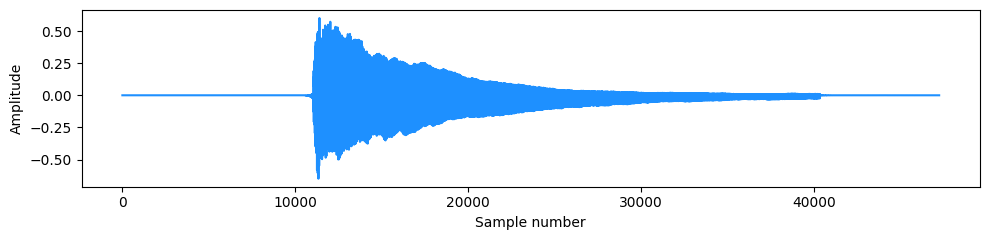

In [41]:
import librosa

x, sr = librosa.load('audio/C4_Piano.wav', sr=None)  
print_plot_play(x=x, sr=sr, text='WAV file: ')  

x, sr = librosa.load('audio/C4_Piano.mp3', sr=None)  
print_plot_play(x=x, sr=sr, text='MP3 file: ')  

#### Torchaudio

**`Torchaudio`** — это тоже библиотека для обработки аудио, которая интегрирована с PyTorch. 

Основная функция для чтения аудио в torchaudio — это `torchaudio.load`. Она возвращает сразу тензор значений аудио и частоту дискретизации.

Особенности:

- Поддерживает широкий спектр форматов аудио
- Позволяет задать желаемую частоту дискретизации при загрузке.
- По умолчанию нормализует аудио в диапазон $[-1, 1]$.
- Есть функции для аугментации, которые используются в DL.

WAV file:  sr = 11025, x.shape = torch.Size([1, 45504]), x.dtype = torch.float32


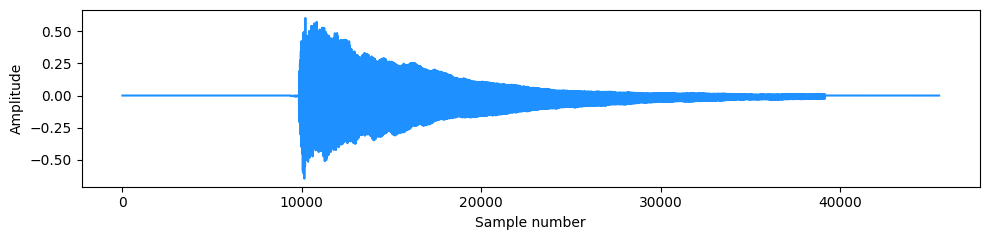

MP3 file:  sr = 11025, x.shape = torch.Size([1, 47232]), x.dtype = torch.float32


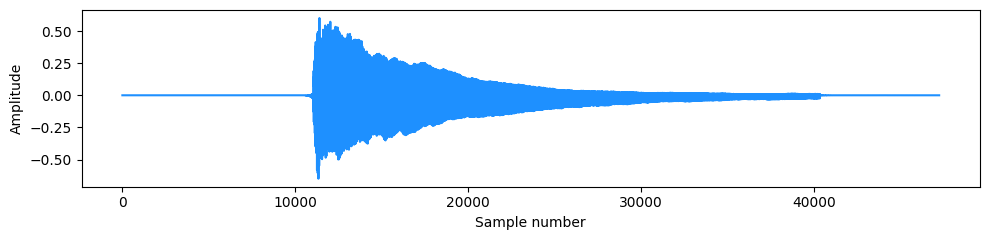

In [42]:
import torchaudio

x, sr = torchaudio.load('audio/C4_Piano.wav')
print_plot_play(x=x, sr=sr, text='WAV file: ')  

x, sr = torchaudio.load('audio/C4_Piano.mp3')
print_plot_play(x=x, sr=sr, text='MP3 file: ') 

| Особенности                  | SoundFile       | LibROSA                  | torchaudio                   |
|---------------------------|-------------------|------------------------|------------------------------|
| Чтение аудио              | soundfile.read    | librosa.load           | torchaudio.load             |
| Частота дискретизации     | Нет передискретизации    | По умолчанию 22050 Hz  | Можно задать произвольную    |
| Нормализация              | В диапазоне [-1, 1] | В диапазоне [-1, 1]   | В диапазоне [-1, 1]         |
| Многоканальное аудио      | Да                | Да                     | Да                           |
| Интеграция с DL | Нет           | Нет                    | Да                         |


### Resampling

Любое аудио на компьютере создается с фиксированной частотой дискретизации (и разрешением). Иногда бывает полезно изменить частоту дискретизации, то есть сделать **"передискретизацию"** (**resampling**).

**Повышение частоты дискретизации** (**интерполяция**) — это процесс преобразования из низкой частоты дискретизации в более высокую (например, с 44,1 кГц до 48 кГц).

**Понижающая дискретизация** (**прореживание**) — это процесс преобразования с высокой частоты дискретизации в более низкую (например, с 96 кГц до 48 кГц).

#### Зачем?

1) Обработка аудио с меньшей частотой дискретизации требует меньше вычислительных ресурсов, это позволяет ускорить различные операции и сэкономить память.

2) Иногда повышая частоту дискретизации, мы можем получить более чистое и детальное звучание. Но это зависит от качества алгоритма передискретизации.

In [43]:
y, sr = librosa.load('audio/Pirate.wav', sr=None)

print(f"Original Audio: ({sr} Hz)")
display(ipd.Audio(y, rate=sr))

sample_rates = [96000, 22050, 16000, 8000, 4000]

for i, target_sr in enumerate(sample_rates):
    y_resampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
    
    print(f"Resampled Audio (to {target_sr} Hz):")
    display(ipd.Audio(y_resampled, rate=target_sr))

Original Audio: (44100 Hz)


Resampled Audio (to 96000 Hz):


Resampled Audio (to 22050 Hz):


Resampled Audio (to 16000 Hz):


Resampled Audio (to 8000 Hz):


Resampled Audio (to 4000 Hz):


#### Discrete Fourier Transform

Нам хотелось бы знать информацию о частотах, которые присутствуют в реальных сигналах. Другими словами, нас интересует спектр нашего сигнала, который позволяет нам визуально оценить, какие частоты преобладают в сигнале.

Для получения спектра мы будем использовать **дискретное преобразование Фурье** (**DFT**). Если у нас есть дискретный сигнал $x(k)$, где $k = 0, 1, ..., N-1$, то DFT этого сигнала $\overline{X}(n)$ вычисляется по формуле:

$$\overline{X}(n) = \sum_{k=0}^{N-1}x(k)e^{-i\frac{2\pi n k}{N}}$$

Если мы представим произвольный отсчет DFT в виде суммы действительной и мнимой части $Х(n) = Х_{геаl}(n) + iХ_{imag}(n)$, то **амплитуда** и **фаза** вычисляются следующим образом:

$$X_{mag}(n) = |X(n)| = \sqrt{X_{real}(n)^2 + X_{imag}(n)^2}$$

$$X_\varphi(n) = \arctan{\frac{X_{imag}(n)}{X_{real}(n)}}$$

Для нахождения **спектра мощности** нужно возвести амплитуду в квадрат:

$$X_{PS}(n) = X_{mag}(n)^2 = X_{real}(n)^2 + X_{imag}(n)^2$$

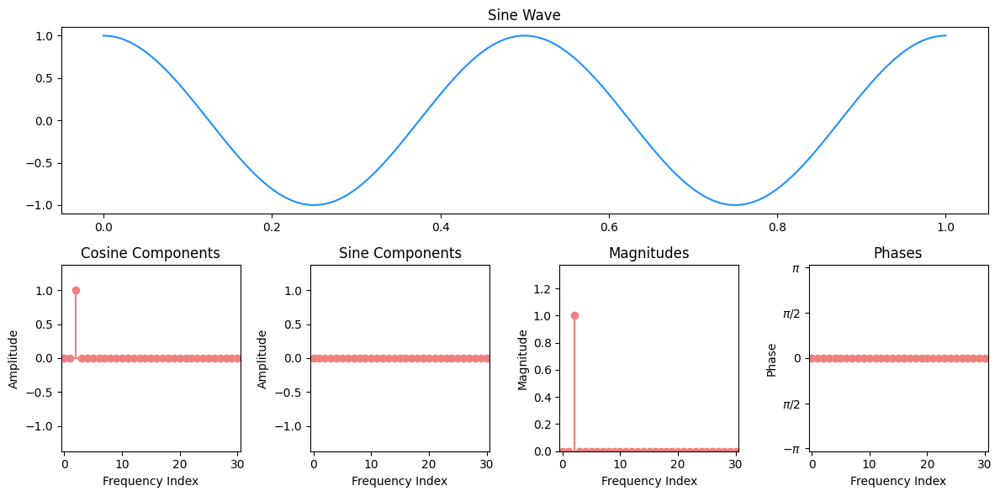

In [44]:
def get_dft(x):
    """
    Return the non-redundant real/imaginary components
    of the DFT, expressed as amplitudes of sines/cosines involved
    
    Parameters
    ----------
    x: ndarray(N)
        A signal
    
    Returns
    -------
    cos_sum: ndarray(ceil(N/2)), sin_sums(ndarray(ceil(N/2)))
        DFT cosine/sine amplitudes
    """
    # Длина сигнала
    N = len(x)
    
    # Количество частот
    n_freqs = int(np.ceil(N / 2))

    # Считаем ДПФ
    spec = np.fft.fft(x)
    cos_sums = np.real(spec)[0:n_freqs] / (N / 2)
    sin_sums = np.imag(spec)[0:n_freqs] / (N / 2)
    return cos_sums, sin_sums

def plot_signal_dft(signal_type, frequency, duration, sr=44100, max_freq_index=50):
    """
    Plot the DFT components of a signal (square, triangle, or sine wave)
    
    Parameters
    ----------
    signal_type: str
        Type of the signal ('square', 'triangle', or 'sine')
    frequency: int
        Frequency of the signal
    duration: float
        Duration of the signal in seconds
    sr: int, optional
        Sampling rate (default is 44100 Hz)
    max_freq_index: int, optional
        Maximum frequency index to show in the plots (default is 20)
    """
    N = int(sr * duration)
    t = np.linspace(0, duration, N, endpoint=False)
    
    if signal_type == 'square':
        x = np.sign(np.sin(2 * np.pi * frequency * t))
        title = "Square Wave"
    elif signal_type == 'triangle':
        x = 2 * np.mod(np.linspace(0, frequency, N), 1) - 1
        title = "Triangle Wave"
    elif signal_type == 'sine':
        x = np.cos(2 * np.pi * frequency * t)
        title = "Sine Wave"
    else:
        raise ValueError("Invalid signal type. Choose 'square', 'triangle', or 'sine'.")
    
    c, s = get_dft(x)
    amps = np.sqrt(c**2 + s**2)
    phases = np.arctan2(s, c)
    
    plt.figure(figsize=(12, 6))
    
    plt.subplot2grid((2, 4), (0, 0), rowspan=1, colspan=4)
    plt.plot(t, x, c='dodgerblue')
    plt.ylim([-1.1, 1.1])
    plt.title(title)
    
    plt.subplot(245)
    plt.stem(c[0:max_freq_index+2], basefmt="lightcoral", linefmt='lightcoral', markerfmt='lightcoral')
    plt.xlabel("Frequency Index")
    plt.ylabel("Amplitude")
    plt.title("Cosine Components")
    plt.ylim([-4/np.pi-0.1, 4/np.pi+0.1])
    plt.xlim([-0.5, max_freq_index+0.5])
    
    plt.subplot(246)
    plt.stem(s[0:max_freq_index+2], basefmt="lightcoral", linefmt='lightcoral', markerfmt='lightcoral')
    plt.xlabel("Frequency Index")
    plt.ylabel("Amplitude")
    plt.title("Sine Components")
    plt.ylim([-4/np.pi-0.1, 4/np.pi+0.1])
    plt.xlim([-0.5, max_freq_index+0.5])
    
    plt.subplot(247)
    plt.stem(amps[0:max_freq_index+2], basefmt="lightcoral", linefmt='lightcoral', markerfmt='lightcoral')
    plt.xlabel("Frequency Index")
    plt.ylabel("Magnitude")
    plt.title("Magnitudes")
    plt.ylim([0, 4/np.pi+0.1])
    plt.xlim([-0.5, max_freq_index+0.5])
    
    plt.subplot(248)
    plt.stem((amps[0:max_freq_index+2] > 1e-3) * phases[0:max_freq_index+2], basefmt="lightcoral", linefmt='lightcoral', markerfmt='lightcoral')
    plt.xlim([-0.5, max_freq_index+0.5])
    plt.ylim([-np.pi-0.1, np.pi+0.1])
    plt.yticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi], ["$-\\pi$", "$\\pi/2$", "0", "$\\pi/2$", "$\\pi$"])
    plt.xlabel("Frequency Index")
    plt.ylabel("Phase")
    plt.title("Phases")
    
    plt.tight_layout()
    plt.show()

plot_signal_dft(signal_type='sine', frequency=2, duration=1, max_freq_index=30)

### Spectrum leakage

При практическом применении ДПФ мы сталкиваемся с одним важным ограничением. Если частота некоторой компоненты в анализируемом сигнале не укладывается в целое число периодов за время измерения, то ее энергия распределяется между несколькими частотами. Этот эффект называется **растекание спектра** (**spectrum leakage**) и эта компонента будет распределена между несколькими соседними ячейками, при этом наибольшие значения амплитуды будут у тех частот, которые ближе всего к реальной частоте сигнала. 

$n$-ая частота определяется выражением:

$$f_{analysis}(n) = \frac{nf_s}{N},$$

где $f_s$ - частота дискретизации, $N$ - количество точек в ДПФ.

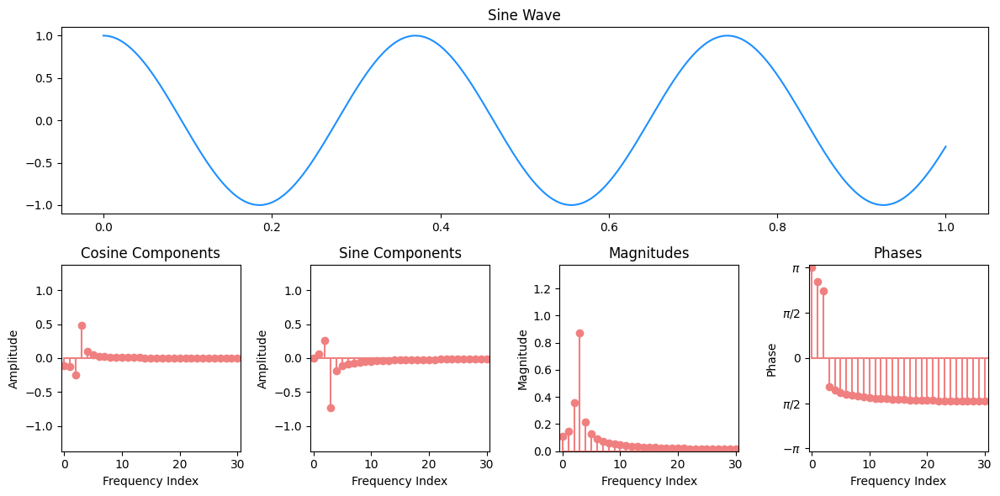

In [45]:
plot_signal_dft(signal_type='sine', frequency=2.7, duration=1, max_freq_index=30)

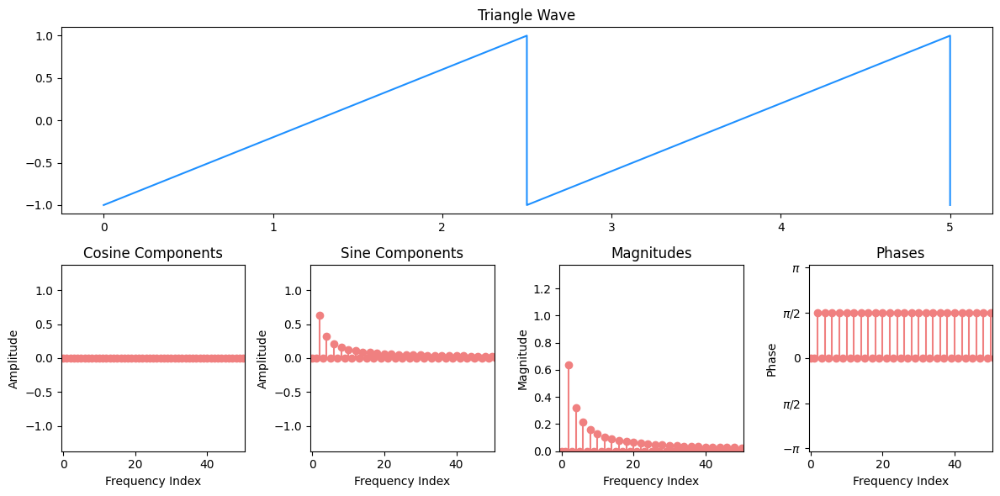

In [46]:
plot_signal_dft(signal_type='triangle', frequency=2, duration=5, max_freq_index=50)

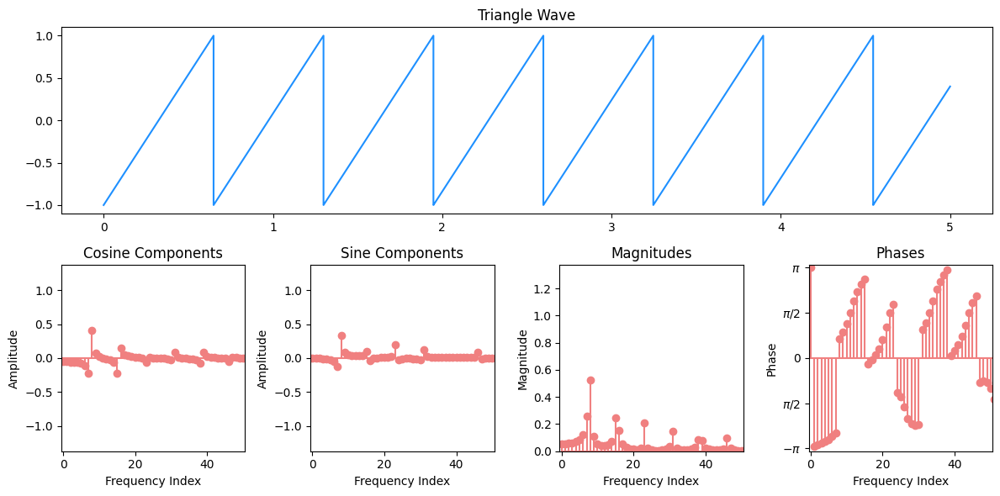

In [47]:
plot_signal_dft(signal_type='triangle', frequency=7.7, duration=5, max_freq_index=50)

### Short-Time Fourier Transform

DFT — это хороший инструмент для анализа стационарных сигналов, то есть сигналов, характеристики которых не меняются со временем. Однако, часто в реальной жизни мы имеем дело с нестационарными сигналами и в таком случае DFT становится недостаточно информативным.

Давайте возьмем более сложный сигнал, который встречается в реальной жизни.

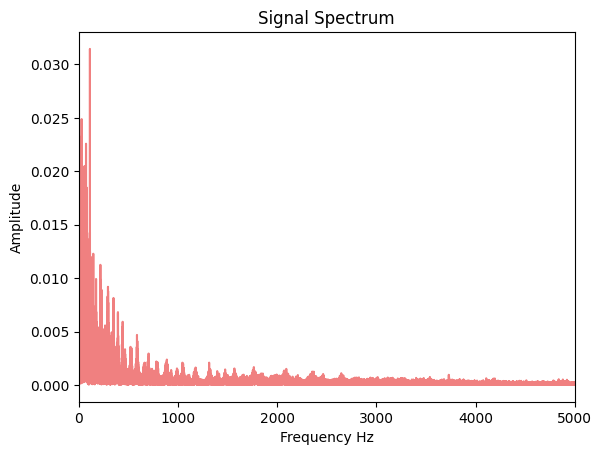

In [48]:
def plot_signal_spectrum(filename, xlim=(0, 5000)):
    
    x, sr = librosa.load(filename)
    N = len(x)
    c, s = get_dft(x)
    
    amps = np.sqrt(c**2 + s**2)
    freqs = np.arange(len(c)) * sr / len(x)
    
    plt.plot(freqs, amps, c='lightcoral')
    plt.xlabel("Frequency Hz")
    plt.ylabel("Amplitude")
    plt.xlim(xlim)
    plt.title("Signal Spectrum")
    plt.show()
    
    return ipd.Audio(x, rate=sr)

plot_signal_spectrum('audio/Pirate.wav')

Давайте начнем с примера попроще и сгенерируем два синусоидальных сигнала с разными частотами и объединим их

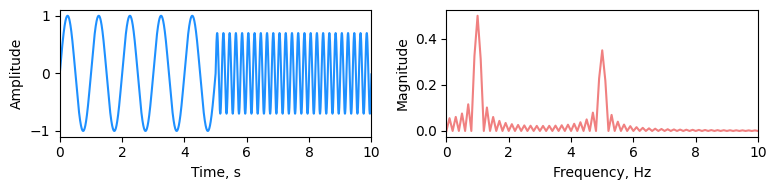

In [49]:
sr = 1280
duration = 10
f1 = 1
f2 = 5
N = int(duration * sr)
t = np.arange(N) / sr
t1 = t[:N//2]
t2 = t[N//2:]

x1 = 1.0 * np.sin(2 * np.pi * f1 * t1)
x2 = 0.7 * np.sin(2 * np.pi * f2 * t2)
audio = np.concatenate((x1, x2))

plt.figure(figsize=(8, 2))
plt.subplot(1, 2, 1)
plt.plot(t, audio, 'dodgerblue')
plt.xlim([0, duration])
plt.xlabel('Time, s')
plt.ylabel('Amplitude')  

plt.subplot(1, 2, 2)
cos, sin = get_dft(audio)
amps = np.sqrt(cos**2 + sin**2)
freqs = np.arange(len(cos)) * sr / len(audio)

plt.plot(freqs, amps[:N//2], 'lightcoral')
plt.xlim([0, 10])
plt.xlabel('Frequency, Hz')
plt.ylabel('Magnitude')  
plt.tight_layout()
plt.show()

**Оконное преобразование Фурье** (**Short-time Fourier transform**, **STFT**) позволяет решить проблему анализа нестационарных сигналов. Этот метод позволяет анализировать спектр сигнала в различные моменты времени. Он работает следующим образом:

**1. Сигнал разбивается на небольшие, перекрывающиеся отрезки.**

**2. Каждый отрезок сигнала умножается на оконную функцию.**

**3. К каждому оконному сигналу применяется ДПФ.**

<center><img src="images/STFT.png" width=600></center>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, FloatSlider, fixed

def windowed_ft(t, signal, sr, window_position_sec, window_length):
    
    total_samples = len(signal)
    window_start = int(sr * window_position_sec)
    window_mask = np.zeros(total_samples)
    window_mask[window_start:window_start + window_length] = 1
    windowed_signal = signal * window_mask

    plt.figure(figsize=(8, 2))
    plt.subplot(1, 2, 1)
    plt.plot(t, windowed_signal, c='dodgerblue')
    plt.plot(t, window_mask, c='navy')
    plt.xlim([min(t), max(t)])
    plt.ylim([-1.1, 1.1])
    plt.xlabel('Time, s')
    plt.ylabel('Amplitude')

    plt.subplot(1, 2, 2)
    spectrum = np.abs(np.fft.fft(windowed_signal)) / sr
    freq = np.fft.fftfreq(total_samples, d=1/sr)
    spectrum = spectrum[:total_samples//2]
    freq = freq[:total_samples//2]
    plt.plot(freq, spectrum, c='lightcoral')
    plt.xlim([0, 7])
    plt.ylim([0, 3])
    plt.xlabel('Frequency, Hz')
    plt.ylabel('Magnitude')  
    
    plt.tight_layout()
    plt.show()

window_length = 4 * sr

print('Interactive interface for experimenting with different window shifts:')
interact(windowed_ft,
         window_position_sec=FloatSlider(min=0, max=duration-(window_length/sr), step=0.1, 
                continuous_update=False, value=1.7, description='Position'),
                t=fixed(t), signal=fixed(signal), sr=fixed(sr), window_length=fixed(window_length));


Два ключевых параметра, которые определяют характеристики STFT, - это **`длина окна`** (**`window_length`**) и **`шаг окна`** (**`hop_length`**).

**Window_length** - это число отсчетов сигнала, которые используются для вычисления одного ДПФ.

- **Влияние**:
    - **Разрешение по частоте**: Чем длиннее окно, тем выше разрешение по частоте, т.е. мы можем более точно определить частоты присутствующих в сигнале. Однако, это приводит к уменьшению временного разрешения.
      
    - **Разрешение по времени**: Более короткое окно дает лучшее временное разрешение, позволяя точнее определить момент времени, когда происходят изменения в спектре сигнала. Но при этом снижается частотное разрешение.

 
- **Выбор длины окна**:
    - Зависит от характеристик анализируемого сигнала.
    - Для стационарных сигналов можно использовать более длинные окна.
    - Для нестационарных сигналов с быстрыми изменениями амплитуды лучше использовать более короткие окна.
 
**Hop_length** - это число отсчетов, на которое сдвигается окно при каждом последующем вычислении ДПФ.

- **Влияние**:
  
    - **Разрешение по частоте**: Больший шаг окна снижает частотное разрешение, так как между соседними спектральными оценками будет больше "пропусков".
       
    - **Разрешение по времени**: Чем меньше шаг окна, тем более детальное представление о временной эволюции спектра мы получим. Однако, это приводит к увеличению вычислительной сложности.
 
- **Выбор шага окна**:
    - Определяется желаемым уровнем детализации во временной области.
    - Если важна высокая временная точность, то шаг окна должен быть маленьким.
    - Если важна экономия вычислений, то шаг окна может быть больше.

Эти параметры определяют внешний вид **спектрограммы** - визуального представления STFT. Длина окна влияет на вертикальное разрешение (по частоте), а шаг окна - на горизонтальное разрешение (по времени).

### Spectrogram
Мы также можем определить специальную версию STFT, где рассматриваются только амплитуды (без фазы), которая называется **спектрограммой**. Обычно она определяется следующим образом:

$$spectrogram(t,\omega) = |STFT(t,\omega)|^2$$

<center><img src="images/spectrogram.png" width=500></center>

In [50]:
def hann_window(window_length):
    return 0.5 - 0.5 * np.cos(2 * np.pi * np.arange(window_length) / (window_length - 1))

def compute_spectrogram(signal, fs, window_length, hop_size, window_function=hann_window, power_spectrogram=False):
    """
    Compute the spectrogram of a signal
    
    Parameters
    ----------
    signal: ndarray(N)
        The input signal
    window_length: int
        Length of the window
    hop_size: int
        Hop size (step size between windows)
    window_function: int -> ndarray(window_length)
        Function to create the window
    use_log_scale: bool
        Whether to return the logarithm of the spectrogram
    
    Returns
    -------
    ndarray(frequency_bins, time_bins)
        Spectrogram
    """
    # Длина сигнала
    signal_length = len(signal)
    
    # Количество окон, которые поместятся в сигнале с заданным шагом
    num_windows = (signal_length - window_length) // hop_size + 1
    
    # Инициализация матрицы для хранения спектрограммы
    # Размер матрицы: (половина длины окна + 1) x (количество окон)
    spectrogram = np.zeros((window_length // 2 + 1, num_windows))
    
    # Проходим по всем окнам
    for window_index in range(num_windows):
        # Начальная позиция текущего окна
        start_index = window_index * hop_size
        
        # Извлекаем текущий сегмент сигнала и применяем оконную функцию
        windowed_signal = signal[start_index:start_index + window_length] * window_function(window_length)
        
        # Применяем быстрое преобразование Фурье к оконному сегменту
        spectrum = np.fft.rfft(windowed_signal)

        if power_spectrogram:
            spectrogram[:, window_index] = np.abs(spectrum) ** 2
        else:
            spectrogram[:, window_index] = np.abs(spectrum)

    f = np.fft.rfftfreq(window_length, 1 / fs)
    t = np.arange(num_windows) * (hop_size) / fs
    
    return f, t, spectrogram

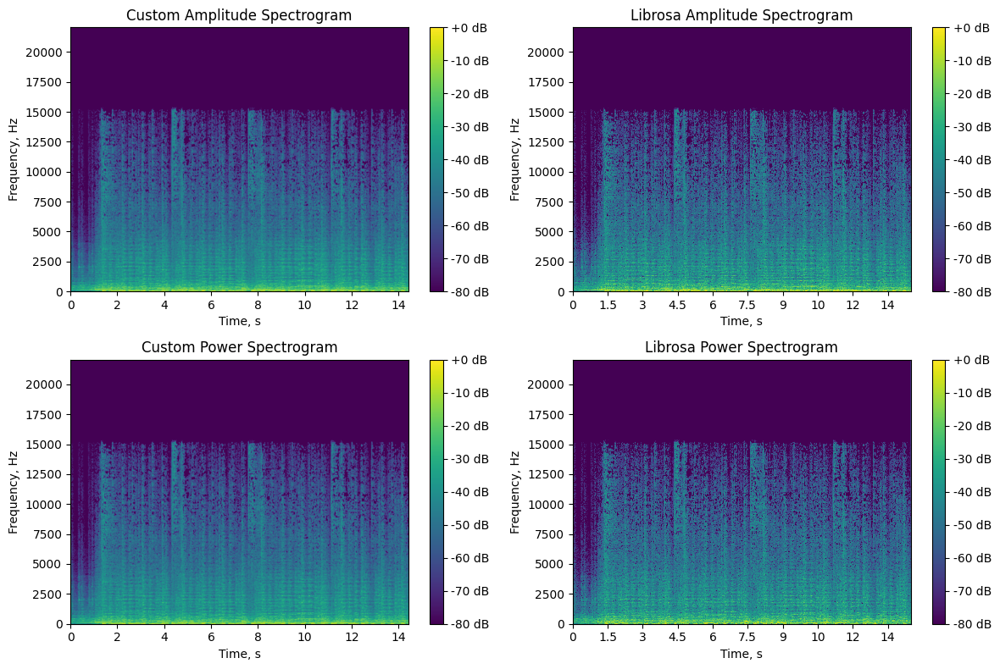

In [51]:
audio, sr = librosa.load('audio/Pirate.wav', sr=None)
window_length = 2048
hop_size = 512

# Моя реализация
f, t, S_custom_amplitude = compute_spectrogram(audio, sr, window_length, hop_size, window_function = hann_window)
S_custom_amplitude = librosa.amplitude_to_db(S_custom_amplitude, ref=np.max)
extent = [t.min(), t.max(), f.min(), f.max()]

f, t, S_custom_power = compute_spectrogram(audio, sr, window_length, hop_size, window_function = hann_window, power_spectrogram=True)
S_custom_power = librosa.power_to_db(S_custom_power, ref=np.max)

# Спектрограмма с помощью librosa
D = librosa.stft(audio, n_fft=window_length, hop_length=hop_size, window='hann')
S_librosa_amplitude = librosa.amplitude_to_db(np.abs(D), ref=np.max)
S_librosa_power = librosa.power_to_db(np.abs(D) ** 2, ref=np.max)

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(S_custom_amplitude, aspect='auto', origin='lower', extent=extent, cmap='viridis')
plt.colorbar(format='%+2.0f dB')
plt.xlabel('Time, s')
plt.ylabel('Frequency, Hz')
plt.title('Custom Amplitude Spectrogram')

plt.subplot(2, 2, 2)
librosa.display.specshow(S_librosa_amplitude, sr=sr, hop_length=hop_size, x_axis='time', y_axis='linear', cmap='viridis')
plt.colorbar(format='%+2.0f dB')
plt.xlabel('Time, s')
plt.ylabel('Frequency, Hz')
plt.title('Librosa Amplitude Spectrogram')

plt.subplot(2, 2, 3)
plt.imshow(S_custom_power, aspect='auto', origin='lower', extent=extent, cmap='viridis')
plt.colorbar(format='%+2.0f dB')
plt.xlabel('Time, s')
plt.ylabel('Frequency, Hz')
plt.title('Custom Power Spectrogram')

plt.subplot(2, 2, 4)
librosa.display.specshow(S_librosa_power, sr=sr, hop_length=hop_size, x_axis='time', y_axis='linear', cmap='viridis')
plt.colorbar(format='%+2.0f dB')
plt.xlabel('Time, s')
plt.ylabel('Frequency, Hz')
plt.title('Librosa Power Spectrogram')

plt.tight_layout()
plt.show()

### Time vs Frequency Resolution Tradeoff
Давайте рассмотрим сигнал, частота которого постепенно увеличивается со временем. Такой сигнал называется "**чирп**" Его можно описать функцией

$$f(t) = \sin(400\pi t^2)$$


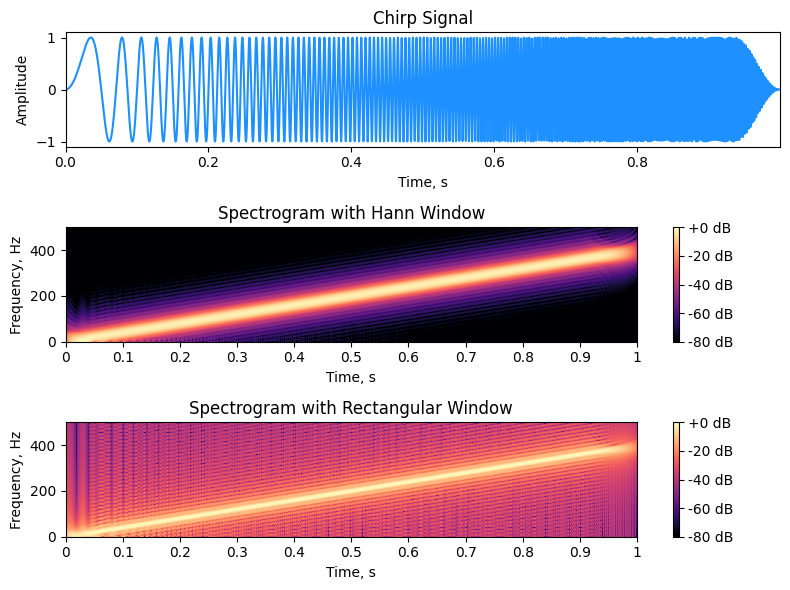

In [52]:
duration = 1.0
sr= 4000
N = int(duration * sr)
t = np.arange(0, N) / sr
x = np.sin(np.pi * 400 * t * t)

size_fade = 256
w_fade = np.hanning(size_fade * 2)[size_fade:]
x[-size_fade:] *= w_fade

ipd.display(ipd.Audio(x, rate=sr))

# Параметры окна
w_len_ms = 62.5
N = int((w_len_ms / 1000) * sr)
hop_length = 4

# Вычисление STFT с разными окнами
X_hann = librosa.stft(x, n_fft=N*16, hop_length=hop_length, win_length=N, window='hann', center=True, pad_mode='constant')
X_rect = librosa.stft(x, n_fft=N*16, hop_length=hop_length, win_length=N, window='boxcar', center=True, pad_mode='constant')

plt.figure(figsize=(8, 6))

# График сигнала
plt.subplot(3, 1, 1)
plt.plot(t, x, c='dodgerblue')
plt.xlabel('Time, s')
plt.ylabel('Amplitude')
plt.xlim([t[0], t[-1]])
plt.title('Chirp Signal')

# Спектрограмма с окном Ханна
plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(np.abs(X_hann), ref=np.max), 
                         y_axis='linear', x_axis='time', sr=sr, hop_length=hop_length)
plt.clim([-80, 0])
plt.ylim([0, 500])
plt.xlim([0, 1])
plt.colorbar(format='%+2.0f dB')
plt.xlabel('Time, s')
plt.ylabel('Frequency, Hz')
plt.title('Spectrogram with Hann Window')

plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(np.abs(X_rect), ref=np.max), 
                         y_axis='linear', x_axis='time', sr=sr, hop_length=hop_length)
plt.clim([-80, 0])
plt.ylim([0, 500])
plt.xlim([0, 1])
plt.colorbar(format='%+2.0f dB')
plt.xlabel('Time, s')
plt.ylabel('Frequency, Hz')
plt.title('Spectrogram with Rectangular Window')

plt.tight_layout()
plt.show()


На спектрограммах мы видим яркую диагональную полосу, которая показывает, постепенное увеличение частоты со временем. Однако, на спектрограмме также присутствуют дополнительные полосы, которые возникают из-за особенностей типа окон. Их можно уменьшить, используя разные окна (например, окно Ханна вместо прямоугольного).

Давайте рассмотрим пример, который показывает важность еще и размера окна. Представим себе сигнал, состоящий из двух синусоид с частотами $400$ Гц и $450$ Гц, и двух $\delta$-импульсов в моменты времени $t_1=0.45$ с и $t_2=0.5$:

$$f(t) = \sin(800\pi t) + \sin(900\pi t) + \delta(t - 0.45) + \delta(t - 0.5)$$

Сигнал интересен тем, что он содержит две близких по времени компоненты (импульсы, разделенные 50 мс) и две близких по частоте компоненты (синусоиды, разделенные 50 Гц).

Попробуем проанализировать этот сигнал с помощью окон различной длительности:

- **Маленькое окно** (**32 мс**)
- **Большое окно** (**128 мс**)

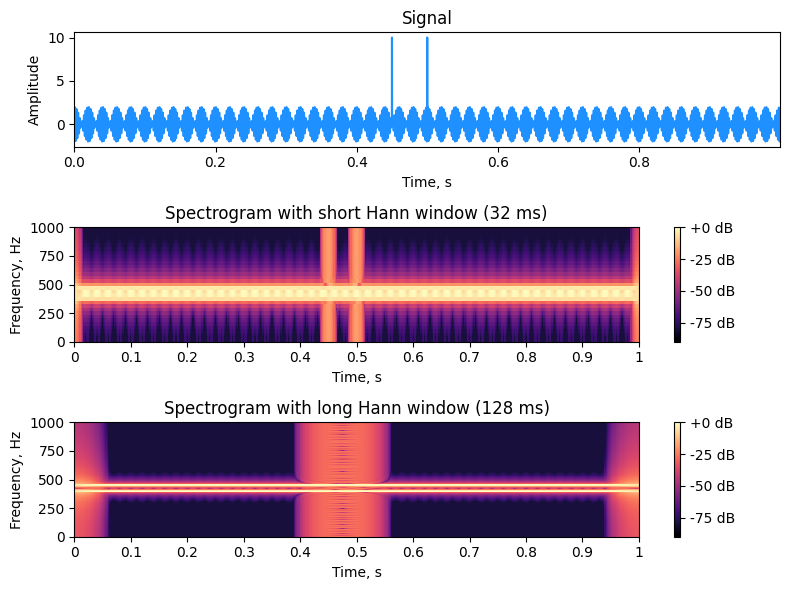

In [53]:
# Параметры сигнала
duration = 1.0
sr = 8000
t = np.arange(int(duration * sr)) / sr
x = np.sin(2 * np.pi * 400 * t) + np.sin(2 * np.pi * 450 * t)
x[int(round(0.45 * sr))] = 10
x[int(round(0.50 * sr))] = 10

ipd.display(ipd.Audio(x, rate=sr))

fig, axs = plt.subplots(3, 1, figsize=(8, 6))

axs[0].plot(t, x, c='dodgerblue')
axs[0].set_xlabel('Time, s')
axs[0].set_ylabel('Amplitude')
axs[0].set_xlim([t[0], t[-1]])
axs[0].set_title('Signal')

# Спектрограмма для короткого окна
w_len_ms = 32
N = int((w_len_ms / 1000) * sr)
hop_length = 16
X_short = librosa.stft(x, n_fft=N, hop_length=hop_length, win_length=N, window='hann', center=True, pad_mode='constant')
img = librosa.display.specshow(librosa.amplitude_to_db(np.abs(X_short), ref=np.max),
                               y_axis='linear', x_axis='time', sr=sr, hop_length=hop_length, ax=axs[1])
img.set_clim([-90, 0])
axs[1].set_ylim([0, 1000])
axs[1].set_xlim([0, 1])
axs[1].set_xlabel('Time, s')
axs[1].set_ylabel('Frequency, Hz')
axs[1].set_title('Spectrogram with short Hann window (32 ms)')

# Спектрограмма для длинного окна
w_len_ms = 128
N = int((w_len_ms / 1000) * sr)
X_long = librosa.stft(x, n_fft=N, hop_length=hop_length, win_length=N, window='hann', center=True, pad_mode='constant')
img2 = librosa.display.specshow(librosa.amplitude_to_db(np.abs(X_long), ref=np.max),
                                y_axis='linear', x_axis='time', sr=sr, hop_length=hop_length, ax=axs[2])
img2.set_clim([-90, 0])
axs[2].set_ylim([0, 1000])
axs[2].set_xlim([0, 1])
axs[2].set_xlabel('Time, s')
axs[2].set_ylabel('Frequency, Hz')
axs[2].set_title('Spectrogram with long Hann window (128 ms)')

fig.colorbar(img, ax=axs[1], orientation='vertical', format='%+2.0f dB')
fig.colorbar(img2, ax=axs[2], orientation='vertical', format='%+2.0f dB')

plt.tight_layout()
plt.show()

**Окно длиной 32 мс позволяет точно разделить два импульса, так как в каждом окне не более одного импульса. Однако, две близких частотных компоненты оказываются размытыми.**

**Увеличение окна до 128 мс позволяет чётко разделить частотные компоненты, но вызывает большее размытие во времени, из-за чего два импульса уже не разделяются.**

#### Mel spectrogram

Оказывается, что наш слух более чувствителен к изменениям низких частот. Поэтому был придуман способ измерять высоту звука так, чтобы одинаковые интервалы по частоте воспринимались нами так же одинаково, вне зависимости от области частот.

Формула перехода от герц к мел-шкале были выведены эмпирически, посредством проведения большого количества психоакустических тестов.

Для перевода из герц в мел-шкалу используют следующую формулу:

$$m=2595\cdot log_{10}(1+\frac{f}{700}),$$

$m$ - значение в мел-шкале, $f$ - частота в Гц.

**Алгоритм вычисления мел-спектрограммы**:

1. Вычислить спектрограмму 

2. Построить мел-фильтры

3. Преобразовать частоту в мел-шкалу, применив к спектрограмме банк мел-фильтров.

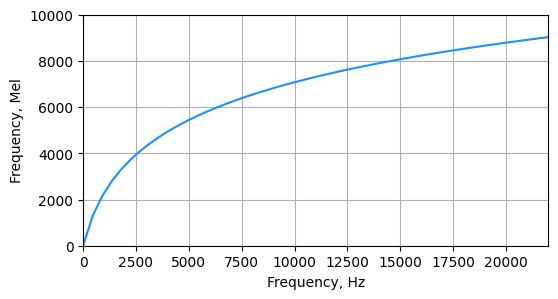

In [54]:
hz = np.linspace(0, 22000)
mel = 2595 * np.log(1 + hz/700)
fig, ax = plt.subplots(figsize=(6, 3))
ax.plot(hz, mel, color='dodgerblue')
plt.xlabel('Frequency, Hz')
plt.ylabel('Frequency, Mel')
plt.grid(True)
plt.xlim(0,22000)
plt.ylim(0,10000)
plt.show()

Получить мел-фильтры можно с помощью уже знакомой библиотеки `librosa`.

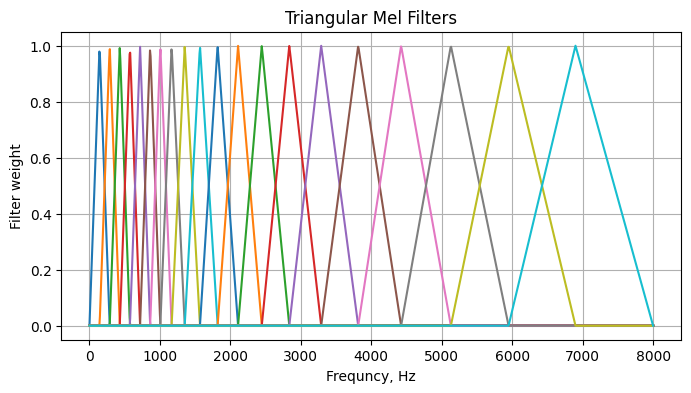

In [55]:
sr=16000
n_mels=20

mel_filters = librosa.filters.mel(
    n_fft=2048, sr=sr, 
    n_mels=n_mels, fmin=0.0, 
    fmax=None, norm=None
)

freqs = librosa.fft_frequencies(sr=sr, n_fft=2048)
plt.figure(figsize=(8, 4))
for i in range(n_mels):
    plt.plot(freqs, mel_filters[i])
plt.xlabel('Frequncy, Hz')
plt.ylabel('Filter weight')
plt.title('Triangular Mel Filters')
plt.grid(True)
plt.show()

По умолчанию происходит нормировка на мощность сигнала.

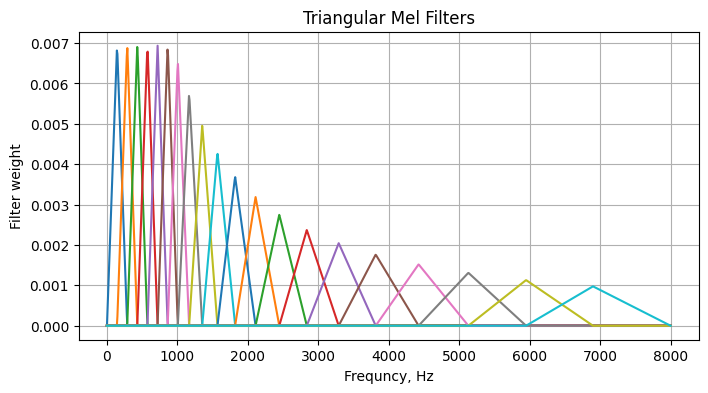

In [56]:
sr=16000
n_mels=20

mel_filters = librosa.filters.mel(
    n_fft=2048, sr=sr, 
    n_mels=n_mels, fmin=0.0, 
    fmax=None
)

freqs = librosa.fft_frequencies(sr=sr, n_fft=2048)
plt.figure(figsize=(8, 4))
for i in range(n_mels):
    plt.plot(freqs, mel_filters[i])
plt.xlabel('Frequncy, Hz')
plt.ylabel('Filter weight')
plt.title('Triangular Mel Filters')
plt.grid(True)
plt.show()

In [57]:
def compute_mel_spectrogram(x, sr, win_length, hop_size, min_freq, max_freq, n_mels):
    # Вычисляем спектрограмму сигнала
    f, t, S = compute_spectrogram(x, sr, win_length, hop_size, window_function=hann_window, power_spectrogram=True)
    
    # Получаем мел-фильтры из librosa
    M = librosa.filters.mel(sr=sr, n_fft=win_length, n_mels=n_mels, fmin=min_freq, fmax=max_freq)
    
    # Применяем мел-фильтры к спектрограмме (умножение матрицы фильтров на квадрат значений спектрограммы)
    mel_specgram = M.dot(S)
    
    return f, t, mel_specgram

Text(0.5, 1.0, 'Custom Mel spectrogram')

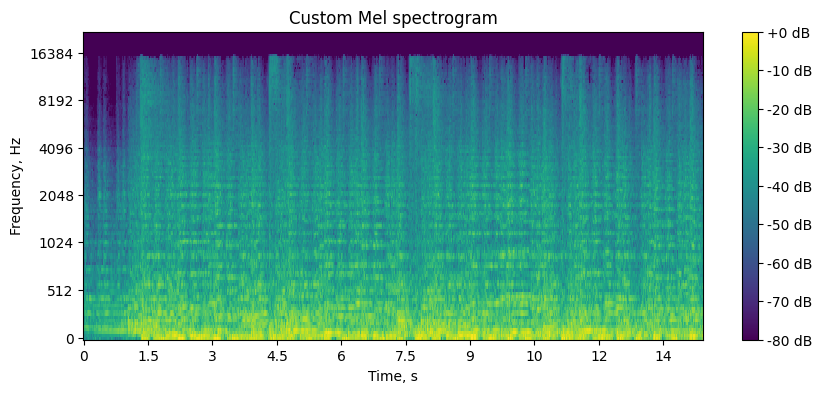

In [58]:
audio, sr = librosa.load('audio/Pirate.wav', sr=None)
window_length = 2048  # Длина окна FFT
hop_length = 512  # Шаг между окнами
n_mels = 128  # Количество мел-фильтров

f, t, custom_mel_spec = compute_mel_spectrogram(audio, sr, window_length, hop_length, min_freq=0, max_freq=sr/2, n_mels=n_mels)
custom_mel_spec = librosa.power_to_db(custom_mel_spec, ref=np.max)

plt.figure(figsize=(10, 4))
librosa.display.specshow(custom_mel_spec, sr=sr, hop_length=hop_length, x_axis='time', y_axis='mel', cmap='viridis')
plt.colorbar(format='%+2.0f dB')
plt.xlabel('Time, s')
plt.ylabel('Frequency, Hz')
plt.title('Custom Mel spectrogram')

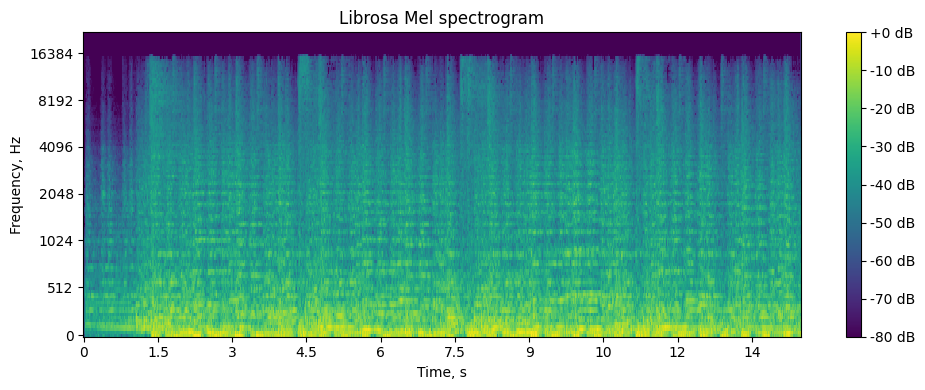

In [59]:
file_path = 'audio/Pirate.wav'
x, sr = librosa.load(file_path, sr=None)
hop_length = 512  # Шаг между окнами
n_mels = 128  # Количество мел-фильтров

# Вычисление мел-спектрограммы
mel_spectrogram = librosa.feature.melspectrogram(y=x, sr=sr, hop_length=hop_length, n_mels=n_mels)

# Преобразование мел-спектрограммы в dB
mel_spectrogram_db = librosa.power_to_db(mel_spectrogram, ref=np.max)

# Построение мел-спектрограммы
plt.figure(figsize=(10, 4))
librosa.display.specshow(mel_spectrogram_db, sr=sr, hop_length=hop_length, x_axis='time', y_axis='mel', cmap='viridis')
plt.colorbar(format='%+2.0f dB')
plt.title('Librosa Mel spectrogram')
plt.xlabel('Time, s')
plt.ylabel('Frequency, Hz')
plt.tight_layout()
plt.show()

### Digital Filtering

Создадим сигнал, состоящий из четырех компонент:

- Низкая частота (5 Гц) — полезный сигнал

- Средняя частота (50 Гц) — помеха

- Высокая частота (300 Гц) — высокочастотный шум

- Нормальный шум

In [60]:
fs = 2000
T = 1.0
t = np.linspace(0, T, int(T * fs), endpoint=False)

sig_low = np.sin(2 * np.pi * 5 * t)           # 5 Hz (Low frequency)
sig_mid = 0.5 * np.sin(2 * np.pi * 50 * t)    # 50 Hz (Mid frequency)
sig_high = 0.3 * np.sin(2 * np.pi * 300 * t)  # 300 Hz (High frequency)
noise_random = 0.2 * np.random.normal(size=len(t)) # Random noise

dirty_signal = sig_low + sig_mid + sig_high + noise_random

In [61]:
def get_spectrum(sig, fs):
    n = len(sig)
    yf = np.fft.rfft(sig)
    xf = np.fft.rfftfreq(n, 1/fs)
    mag = np.abs(yf) / n 
    return xf, mag

def visualize_filtering(t, original, noisy, filtered, fs, title_main, sos=None):
    fig, axes = plt.subplots(2, 3, figsize=(18, 9), constrained_layout=True)
    fig.suptitle(title_main, fontsize=16, weight='bold')
    
    signals = [original, noisy, filtered]
    titles = ["Reference Signal", "Noisy Signal", "Filtered Signal"]
    colors = ['darkgreen', 'orange', 'skyblue']
    
    freqs_filter, abs_h = None, None
    if sos is not None:
        w, h = signal.sosfreqz(sos, worN=4000, fs=fs)
        freqs_filter = w
        abs_h = np.abs(h)

    for i in range(3):
        ax = axes[0, i]
        ax.plot(t, signals[i], color=colors[i], linewidth=1.5)
        ax.set_title(titles[i], fontsize=12)
        ax.set_xlabel("Time (s)")
        ax.set_ylabel("Amplitude")
        ax.grid(True, alpha=0.4)
        ax.set_xlim(0, 0.2)

    for i in range(3):
        ax = axes[1, i]
        
        xf, mag = get_spectrum(signals[i], fs)
        ax.plot(xf, mag, color=colors[i], label='Signal Spectrum', zorder=1)
        ax.fill_between(xf, mag, alpha=0.3, color=colors[i], zorder=1)
        
        ax.set_title(f"Spectrum: {titles[i]}", fontsize=12)
        ax.set_xlabel("Frequency, Hz")
        ax.set_ylabel("Magnitude")
        ax.grid(True, alpha=0.4)
        ax.set_xlim(0, 400) 
        ax.set_ylim(bottom=0) 
        
        if sos is not None and i > 0:
            ax.plot(freqs_filter, abs_h, color='black', linestyle='--', 
                     linewidth=2.5, label='Filter Response', zorder=2)
            
            if i == 2:
                ax.legend(loc='upper right')
                
        ax.set_ylim(0, 1.1)

    plt.show()

##### Фильтр нижних частот (ФНЧ / Low-Pass Filter)

Фильтр нижних частот пропускает сигналы с частотой ниже частоты среза $f_c$ и подавляет всё, что выше.

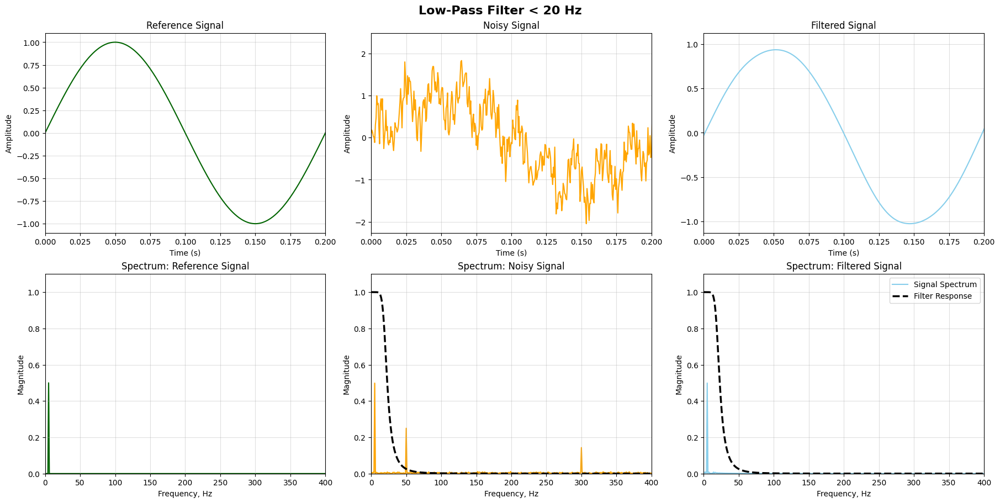

In [62]:
sos_lp = signal.butter(4, 20, btype='low', fs=fs, output='sos')
filtered_lp = signal.sosfiltfilt(sos_lp, dirty_signal)

visualize_filtering(t, sig_low, dirty_signal, filtered_lp, fs, 
                    "Low-Pass Filter < 20 Hz", sos=sos_lp)

##### Фильтр верхних частот (ФВЧ / High-Pass Filter)

ТФильтр верхних частот блокирует низкие частоты и пропускает высокие.

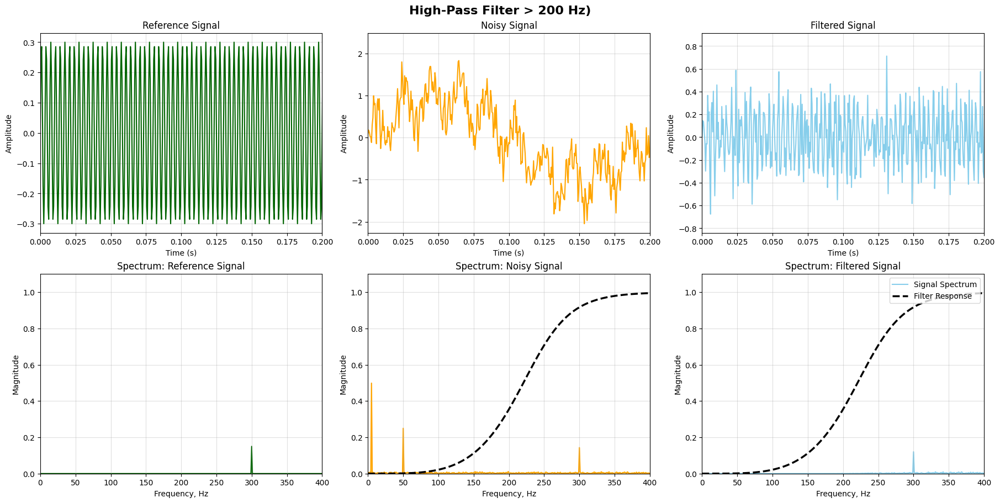

In [64]:
# High-Pass Filter, pass > 200 Hz
sos_hp = signal.butter(4, 250, btype='high', fs=fs, output='sos')
filtered_hp = signal.sosfiltfilt(sos_hp, dirty_signal)

visualize_filtering(t, sig_high, dirty_signal, filtered_hp, fs, 
                    "High-Pass Filter > 200 Hz)", sos=sos_hp)

##### Полосовой фильтр (ПФ / Band-Pass Filter)

Полосовой фильтр пропускает частоты внутри определенного диапазона и подавляет всё снаружи.

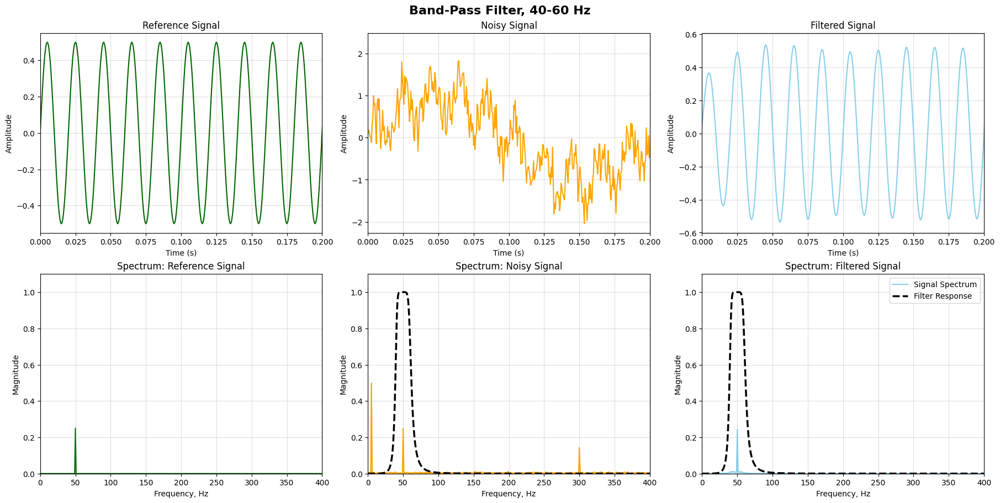

In [65]:
# Band-Pass Filter, pass 40-60 Hz
sos_bp = signal.butter(4, [40, 60], btype='bandpass', fs=fs, output='sos')
filtered_bp = signal.sosfiltfilt(sos_bp, dirty_signal)

visualize_filtering(t, sig_mid, dirty_signal, filtered_bp, fs, 
                    "Band-Pass Filter, 40-60 Hz", sos=sos_bp)

##### Заграждающий фильтр (Режекторный / Band-Stop Filter)

Заграждающий фильтр вырезает узкую полосу частот, пропуская всё остальное.

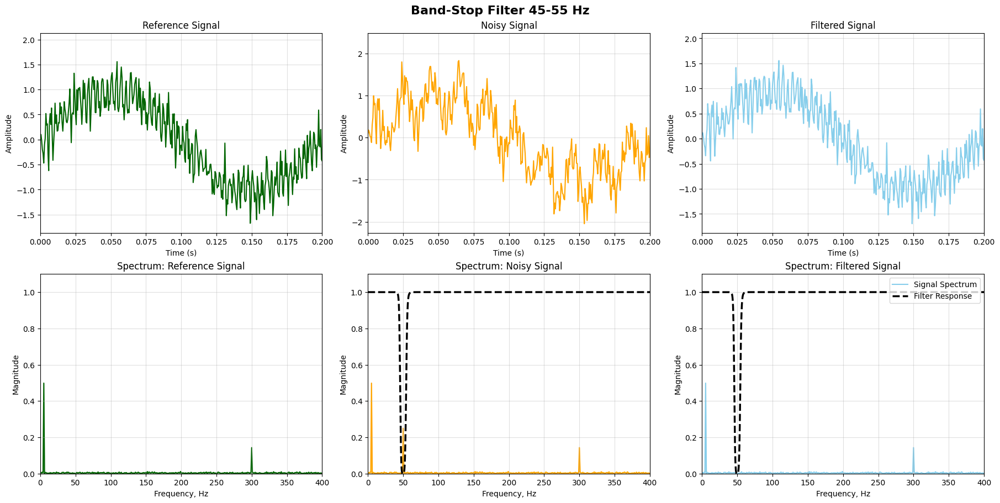

In [66]:
# Band-Stop Filter, stop 45-55 Hz
sos_bs = signal.butter(4, [45, 55], btype='bandstop', fs=fs, output='sos')
filtered_bs = signal.sosfiltfilt(sos_bs, dirty_signal)
target_no_hum = sig_low + sig_high + noise_random 

visualize_filtering(t, target_no_hum, dirty_signal, filtered_bs, fs, 
                    "Band-Stop Filter 45-55 Hz", sos=sos_bs)

### Digital synthesis

Давайте создадим синусоидальный сигнал, который является основой для многих звуковых волн. Мы будем использовать амплитуду $A$, частоту $f$ и время $t$, чтобы сгенерировать сигнал.
Давайте создадим простейший звук — синусоидальную волну. Изменяя ее амплитуду, частоту и фазу, мы сможем управлять громкостью и высотой.

Text(0, 0.5, 'Amplitude')

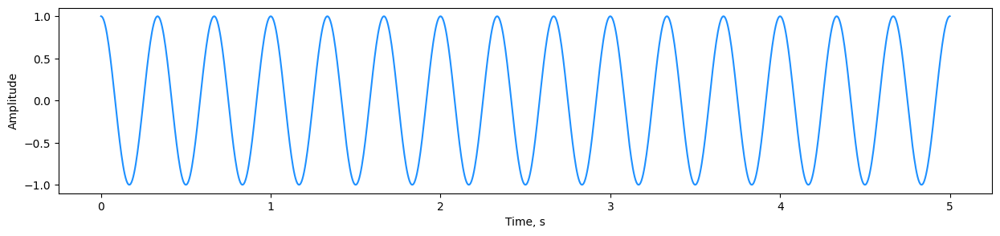

In [67]:
A = 1
f = 3
t = np.linspace(0, 5, 1000)
y = A*np.cos(2*np.pi*f*t)
plt.figure(figsize=(15, 3))
plt.plot(t, y, c='dodgerblue')
plt.xlabel('Time, s')
plt.ylabel('Amplitude')

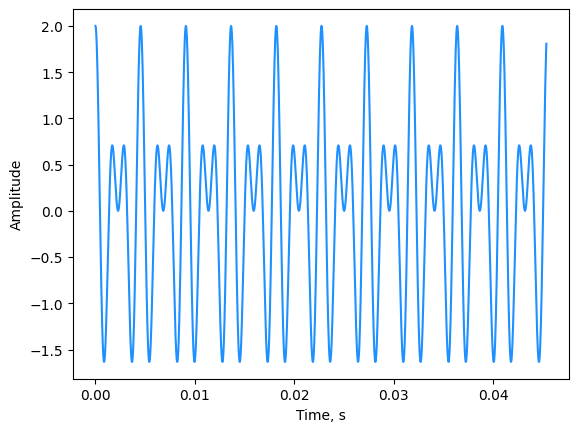

In [68]:
sr = 44100
f1 = 440
f2 = 660
t = np.arange(1.5*sr)/sr
y = np.cos(2*np.pi*f1*t) + np.cos(2*np.pi*f2*t)
plt.plot(t[:2000], y[:2000], c='dodgerblue')
plt.xlabel('Time, s')
plt.ylabel('Amplitude')
ipd.Audio(y, rate=sr)

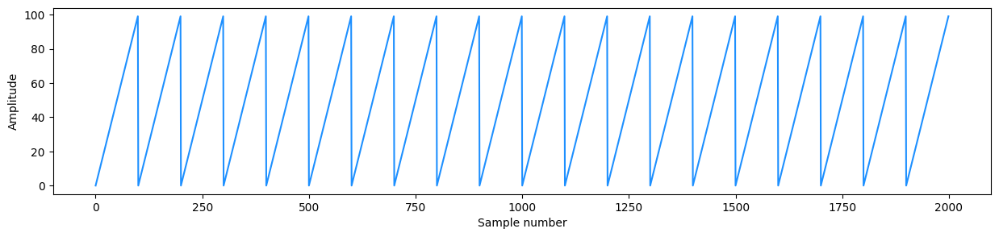

In [69]:
t = np.arange(sr)
y = t % 100
plt.figure(figsize=(15, 3))
plt.plot(y[:2000], c='dodgerblue')
plt.xlabel('Sample number')
plt.ylabel('Amplitude')
ipd.Audio(y, rate=sr)

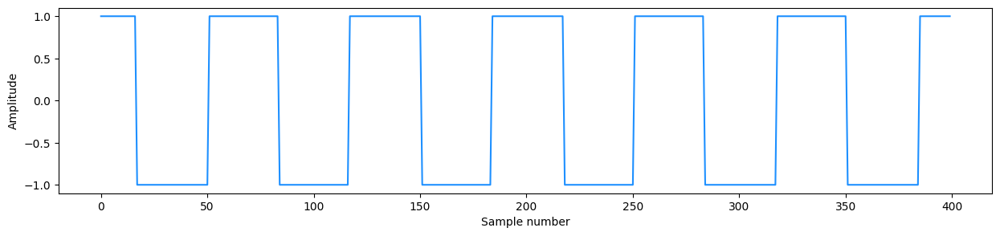

In [70]:
frequency = 660  
duration = 1   
sampling_rate = 44100  

t = np.linspace(0, duration, int(sampling_rate * duration), endpoint=False)
cosine_wave = np.cos(2 * np.pi * frequency * t)
square_wave = np.sign(cosine_wave)

plt.figure(figsize=(15, 3))
plt.plot(square_wave[:400], c='dodgerblue')
plt.xlabel('Sample number')
plt.ylabel('Amplitude')
ipd.Audio(square_wave, rate=sampling_rate)